# Stereo vision: Match and dispay!

- Name: ***Medvedev Ivan***
- Neptun code: ***GJO5BR***

## Imports

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import time
%matplotlib inline

from tqdm.notebook import tqdm
from numba import jit, cuda, vectorize, njit
from google.colab import files
from skimage.color import rgb2gray
from skimage.io import imread, imsave
from google.colab.patches import cv2_imshow
from skimage.metrics import structural_similarity
from IPython.display import display

## Uploading files

In [ ]:
data = ['Art', 'Books', 'Laundry', 'Dolls', 'Reindeer', 'Moebius']

In [ ]:
import wget
import zipfile

for scene in data:
    wget.download(f"https://vision.middlebury.edu/stereo/data/scenes2005/FullSize/zip-2views/{scene}-2views.zip")
    with zipfile.ZipFile(f"{scene}-2views.zip", 'r') as zip_ref:
        zip_ref.extractall('.')

## Input Images

In this work, 6 stereo images from the Middlebury 2005 dataset are used. The algorithms process two main types and compare them with disparity map, which is also included in the dataset

['Art', 'Books', 'Laundry', 'Dolls', 'Reindeer', 'Moebius']

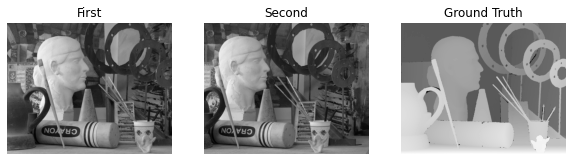

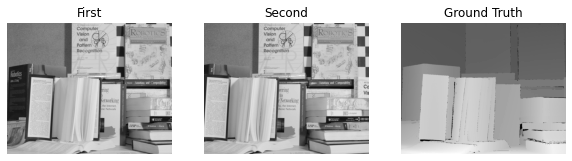

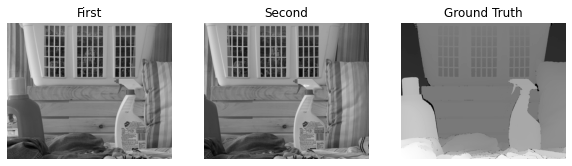

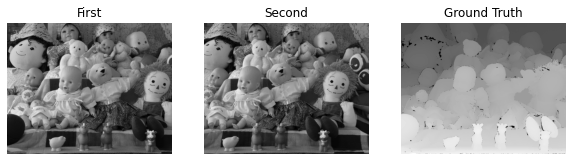

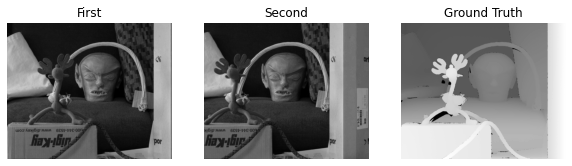

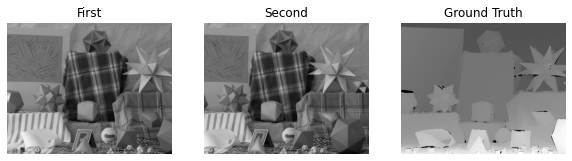

In [ ]:
def plot_input(scene):
    fig = plt.figure(figsize=(10, 7))
      
    Image1 = cv2.imread(f'{scene}/view1.png', 0)
    Image2 = cv2.imread(f'{scene}/view5.png', 0)
    gt = cv2.imread(f'{scene}/disp1.png', 0)

    fig.add_subplot(1, 3, 1)
      
    # showing image
    plt.imshow(Image1, cmap='gray')
    plt.axis('off')
    plt.title("First")
      
    # Adds a subplot at the 2nd position
    fig.add_subplot(1, 3, 2)
      
    # showing image
    plt.imshow(Image2, cmap='gray')
    plt.axis('off')
    plt.title("Second")

    # Adds a subplot at the 3nd position
    fig.add_subplot(1, 3, 3)
      
    plt.imshow(gt, cmap='gray')
    plt.axis('off')
    plt.title("Ground Truth")

    return scene

[plot_input(f) for f in data]

# Subtask 1: Image matching

## Utils

In [ ]:
def plot_disparity(disparity, title):
    plt.figure(figsize = (10,10))
    plt.axis('off')
    plt.title(title, fontsize=24)
    plt.imshow(disparity, cmap='gray');

## Naive stereo matching

I used combinations of a simple matching algorighm winner-takes-it-all (WTA) with several matching costs (Sum of Absolute Differences (SAD), Sum of Squared Differences (SAD))

In [ ]:
def compute_costvolume_sad_wta(left_image, right_image, D=200, R=3):
    Image1 = imread(left_image)
    Image2 = imread(right_image)
    Image1 = rgb2gray(Image1)
    Image2 = rgb2gray(Image2)
    cv_sad = compute_costvolume_sad(Image1, Image2, D, R)
    return compute_wta(cv_sad)

def compute_costvolume_ssd_wta(left_image, right_image, D=200, R=3):
    Image1 = imread(left_image)
    Image2 = imread(right_image)
    Image1 = rgb2gray(Image1)
    Image2 = rgb2gray(Image2)
    cv_sad = compute_costvolume_ssd(Image1, Image2, D, R)
    return compute_wta(cv_sad)

@jit(nopython = True, parallel = True, cache = True)
def compute_costvolume_sad(left_image, right_image, D, R):
    """
    Compute a cost volume with maximum disparity D considering a neighbourhood R with Sum of Absolute Differences (SAD)
        left_image:  left input image of size (H,W)
        right_image: right input image of size (H,W)
        D:           maximum disparity to be considered
        R:           radius of the filter
        return:      cost volume of size (H,W,D)
    """
    
    (H,W) = left_image.shape
    cv    = np.zeros((H,W,D))
    
    # Loop over internal image
    for y in range(R, H - R):
        for x in range(R, W - R):
            
            # Loop over window
            for v in range(-R, R + 1):
                for u in range(-R, R + 1):
                    
                    # Loop over all possible disparities
                    for d in range(0, D):
                        cv[y,x,d] += np.absolute(left_image[y+v, x+u] - right_image[y+v, x+u-d])
        
    return cv

@jit(nopython = True, parallel = True, cache = True)
def compute_costvolume_ssd(left_image, right_image, D, R):
    """
    Compute a cost volume with maximum disparity D considering a neighbourhood R with Sum of Squared Differences (SSD)
    
        left_image:  left input image of size (H,W)
        right_image: right input image of size (H,W)
        D:           maximum disparity
        R:           radius of the filter
    
        return:      cost volume of size (H,W,D)
    """
    
    (H,W) = left_image.shape
    cv    = np.zeros((H,W,D))
    
    # Loop over internal image
    for y in range(R, H - R):
        for x in range(R, W - R):
            
            # Loop over window
            for v in range(-R, R + 1):
                for u in range(-R, R + 1):
                    
                    # Loop over all possible disparities
                    for d in range(0, D):
                        cv[y,x,d] += (left_image[y+v, x+u] - right_image[y+v, x+u-d])**2
        
    return cv

def compute_wta(cv):
    '''
    Compute the best disparity on a scan line using winner-takes-it-all
        
        @param cv: a given cost volume (H,W,D)
        
        @return    a disparity image (H,W)
    '''
    
    return np.argmin(cv, axis=2)

You can change the input parameters of the algorithms:


In [ ]:
D = 200 #maximum disparity to consider
R = 3  #radius of the window to consider around the scan line point

In [ ]:
wta_sad  = compute_costvolume_sad_wta('Art/view1.png', 'Art/view5.png', D, R)

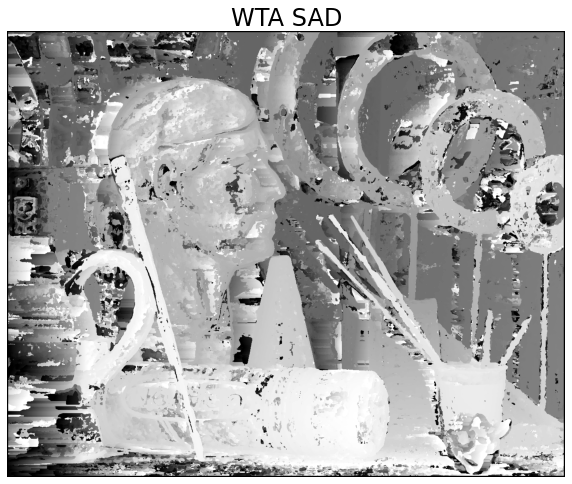

In [ ]:
plot_disparity(wta_sad, 'WTA SAD')

## Dynamic programming

We take each row from both images and compute a forward matching and then backtrack the best path

In [91]:
@jit(nopython = True, cache = True)
def SSD(pixelL,pixelR,sigma=2):
  ssd = (pixelL-pixelR)**2/(sigma**2)
  return ssd

In [92]:
@jit(nopython = True, parallel = True, cache = True)
def dynamic_matching_forward(rowL, rowR, occlusion_cost = 1):
  
  N = rowL.shape[0]
  M = rowR.shape[0]
  cost_matrix = np.ones((N,M))
  match_matrix = np.zeros((N,M))

  cost_matrix[0][0] = SSD(rowL[0], rowR[0])

  for i in range(1, N):
    cost_matrix[i][0] = i*occlusion_cost
  for j in range(1, M):
    cost_matrix[0][j] = j*occlusion_cost

  
  for i in range(1, N):
      for j in range(1, M):
        min1 = cost_matrix[i - 1][j -1] + SSD(rowL[i], rowR[j])
        min2 = cost_matrix[i - 1][j] + occlusion_cost
        min3 = cost_matrix[i][j - 1] + occlusion_cost

        cost_matrix[i][j] = cmin = min(min1, min2, min3)

        if(cmin == min1):
          match_matrix[i][j] = 1
        elif(cmin == min2):
          match_matrix[i][j] = 2
        elif(cmin == min3):
          match_matrix[i][j] = 3

  #match_matrix[N-1][M-1] = 1

  return (match_matrix, cost_matrix)

In [93]:
@jit(nopython = True, parallel = True, cache = True)
def dynamic_matching_backtrack(match_matrix):
  rowL = rowR = match_matrix.shape[0]-1
  disp_vec = np.zeros((match_matrix.shape[0],1))
  disp_acc = 0

  x=list()
  y=list()

  opt_path = np.zeros((match_matrix.shape[0]**2))
  opt_pos = 0
  while(rowL!=0 and rowR!=0):
    z = match_matrix[rowL][rowR]

    x.append(rowL)
    y.append(rowR)

    if(z==1):
      rowL -= 1 
      rowR -= 1
      disp_vec[rowL] = abs(rowR-rowL)
    elif(z==2):
      rowL -= 1 
      disp_acc += 1
      disp_vec[rowL] = 0
    elif(z==3):
      rowR -= 1
      disp_acc -= 1
    
  return (disp_vec, x,y)

In [94]:
def result_disparity(img, disp):
  factor = 255/max(np.unique(disp))
  cv2_imshow(disp*factor)
  return disp*factor

In [95]:
def dynamic_disparity(imgL, imgR, occlusion_cost = 1):
  imgL = cv2.imread(imgL)
  imgR = cv2.imread(imgR)
  imgL_bw = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
  imgR_bw = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)

  disp_map = np.zeros(imgR_bw.shape)

  x_matrix=list()
  y_matrix=list()


  for row in range(imgL_bw.shape[0]):
    row_match_matrix, row_cost_matrix = dynamic_matching_forward(imgL_bw[row], imgR_bw[row], occlusion_cost=1)
    # print("row_cost_matrix: ", row_cost_matrix)
    # print("row_match_matrix: ",row_match_matrix)

    disp_row, x,y = dynamic_matching_backtrack(row_match_matrix)

    x_matrix.append(x)
    y_matrix.append(y)

    # plot_path(opt_path)

    disp_map[row] = disp_row.reshape(imgL_bw.shape[1])
    # print("disp_row: ", disp_row)
  # show_disp = result_disparity(imgL_bw, disp_map)  

  return disp_map

You can change the input parameters of the algorithms:

In [96]:
occlusion_cost = 1

In [97]:
imgL = 'Art/view1.png'
imgR = 'Art/view5.png'

dp_disp = dynamic_disparity(imgL, imgR, occlusion_cost)

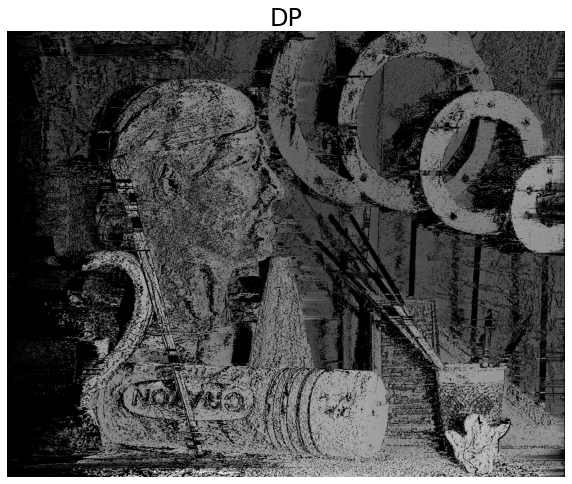

In [98]:
plot_disparity(dp_disp, 'DP')

## OpenCV

Let's also compare the work of my algorithms with the standard implementation from OpenCV

In [ ]:
def opencv_bm(Image1_path, Image2_path, D=208, block_size=15):
    Image1 = cv2.imread(Image1_path, 0)
    Image2 = cv2.imread(Image2_path, 0)
    stereo = cv2.StereoBM_create(numDisparities=D, blockSize=block_size)
    return stereo.compute(Image1,Image2)

In [ ]:
cv_disp = opencv_bm(imgL, imgR)

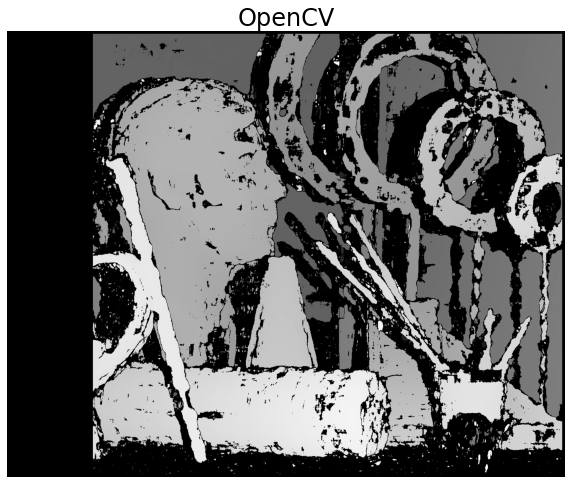

In [ ]:
plot_disparity(cv_disp, 'OpenCV')

# Subtask 2: 3D representation

Standard OpenCV and handwritten function for creating 3D points from disparity map

In [ ]:
def disparity_to_3d_cloud(disparity, left_img):
    """
    reprojects a given image and disparity map to a 3d space with the q projection matrix.
    :param disparity: disparity map as matrix
    :param left_img: matrix representation of the left stereo image
    """
    height, width = disparity.shape

    cloud, color = [], []
    Q = np.array([[1, 0, 0, -695],
                  [0, 1, 0, -550, ],
                  [0, 0, 0, 3740],
                  [0, 0, -0.16, 0]])
    for y in range(0, height):
        for x in range(0, width):
            pix = Q @ [x, y, disparity[y, x], 1]
            # done no regularisation, because of large of numbers and problems displaying them
            # prevent division by zero
            if pix[3] == 0:
                continue

            result = [pix[0] / pix[3], pix[1] / pix[3], pix[2] / pix[3]]
            if np.any(np.isnan(result)) or np.any(np.isinf(result)):
                pass
            elif result[2] <= 0:
                cloud.append([result[1], result[0], result[2]])
                color.append(left_img[y, x])

    verts = np.hstack([points_3D, color])

    np.savetxt(f'{scene}.txt', verts, '%f %f %f %d %d %d')
    files.download(f'{scene}.txt')

In [88]:
def create_points_opencv(disp, scene, Image1):
    Q = np.float32([[1,0,0,0],
        [0,-1,0,0],
        [0,0,2,0], 
        [0,0,0,1]])

    points_3D = cv2.reprojectImageTo3D(disp.astype(int), Q)
    colors = cv2.cvtColor(Image1, cv2.COLOR_BGR2RGB)
    mask = disp.astype(int) > disp.astype(int).min()
    out_points = points_3D[mask]
    out_colors = colors[mask]

    verts = np.hstack([out_points, out_colors])

    np.savetxt(f'{scene}.txt', verts, '%f %f %f %d %d %d')
    files.download(f'{scene}.txt')

# Subtask 3: Evaluation

## Metrics

In [ ]:
def rmse(org_img: np.ndarray, pred_img: np.ndarray, max_p=4095) -> float:
    """
    Root Mean Squared Error
    """

    org_img = org_img.astype(np.float32)

    dif = np.subtract(org_img, pred_img)
    m = np.mean(np.square( dif / max_p))
    s = np.sqrt(m)

    return s

In [ ]:
def ssim(org_img: np.ndarray, pred_img: np.ndarray, max_p=4095) -> float:
    """
    Structural SIMularity index
    """

    return structural_similarity(org_img, pred_img, data_range=max_p, multichannel=True)

In [ ]:
def psnr(org_img: np.ndarray, pred_img: np.ndarray, max_p=4095) -> float:
    """
    Peek Signal to Noise Ratio, implemented as mean squared error converted to dB.
    It can be calculated as
    PSNR = 20 * log10(MAXp) - 10 * log10(MSE)
    When using 12-bit imagery MaxP is 4095, for 8-bit imagery 255. For floating point imagery using values between
    0 and 1 (e.g. unscaled reflectance) the first logarithmic term can be dropped as it becomes 0
    """
    org_img = org_img.astype(np.float32)

    mse_bands = np.mean(np.square(org_img[:, :] - pred_img[:, :]))

    return 20 * np.log10(max_p) - 10. * np.log10(mse_bands)

In [ ]:
def compute_accX(prediction_image, groundtruth_image, mask_image, X = 3):
    '''
    Compute the accX accuracy measure [0..1]
        
        prediction_image:  the stereo image as reconstructed by an algorithm
        groundtruth_image: the ground truth stereo image
        mask_image:        the mask for excluding invalid pixels such as occluded areas
        X:                 threshold disparity measure
        
        return             the accX measure of the reconstructed stereo image
    '''
    
    Z = np.sum(mask_image)
    
    mask_rel = mask_image*(np.absolute(prediction_image - groundtruth_image) <= X)
    return 1/Z*np.sum(mask_rel)

## Reports

To demonstrate how the algorithms work with 6 examples, I created a table with metrics that include: the name of the algorithm, the execution time of the algorithm, indicators for rmse, ssim, psnr metrics.

In [ ]:
def plot_results(results):
    fig = plt.figure(figsize=(20, 20))

    for i, key in enumerate(results.keys()):

        fig.add_subplot(2, 2, i+1)
        
        plt.imshow(results[key], cmap='gray')
        plt.axis('off')
        plt.title(key)
      
    return scene

In [ ]:
pipeline = {
    'SAD_WTA': compute_costvolume_sad_wta,
    'SSD_WTA': compute_costvolume_ssd_wta,
    'DP': dynamic_disparity,
    'Open_CV': opencv_bm
}


def build_report(scene):
    report = {'algorithms': list(pipeline.keys()), 'computation_time': [], 'ssim': [], 'rmse': [], 'psnr': []}
    results = {}
    for key in pipeline.keys():
        start_time = time.time()
        disp = pipeline[key](f'{scene}/view1.png', f'{scene}/view5.png')
        results[key] = disp
        report['computation_time'].append(str(time.time() - start_time)[:5])
        report['ssim'].append(ssim(cv2.imread(f'{scene}/disp1.png', 0), disp))
        report['rmse'].append(rmse(cv2.imread(f'{scene}/disp1.png', 0), disp))
        report['psnr'].append(psnr(cv2.imread(f'{scene}/disp1.png', 0), disp))
    plot_results(results)
    df = pd.DataFrame(report)
    df = df.style.set_caption(f"Report for {scene} scene")
    display(df)

,algorithms,computation_time,ssim,rmse,psnr
0,SAD_WTA,26.35,0.911433,0.012365,38.155855
1,SSD_WTA,25.05,0.912078,0.012317,38.190019
2,DP,43.55,0.624254,0.022677,32.888307
3,Open_CV,0.336,0.015835,0.383578,8.322935


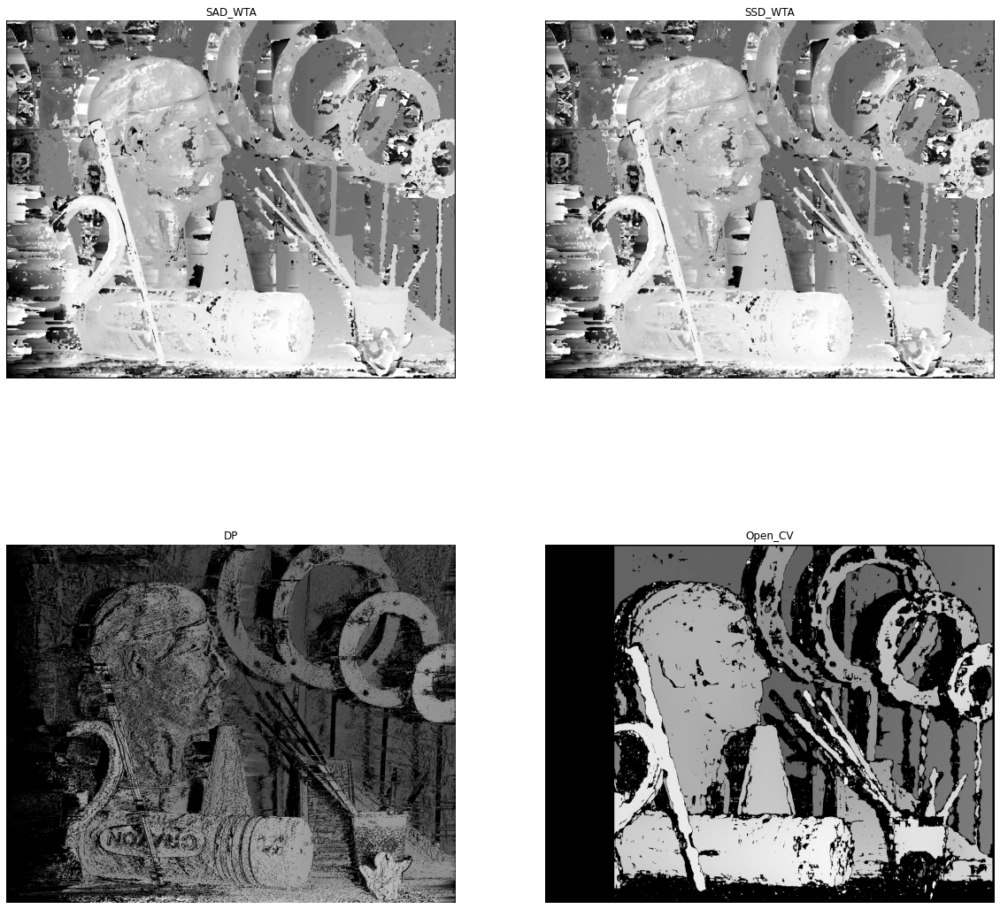

In [ ]:
build_report(data[0])

,algorithms,computation_time,ssim,rmse,psnr
0,SAD_WTA,25.42,0.911586,0.011353,38.897804
1,SSD_WTA,25.06,0.914831,0.011185,39.027609
2,DP,24.72,0.635096,0.022395,32.996839
3,Open_CV,0.306,0.019367,0.350900,9.096322


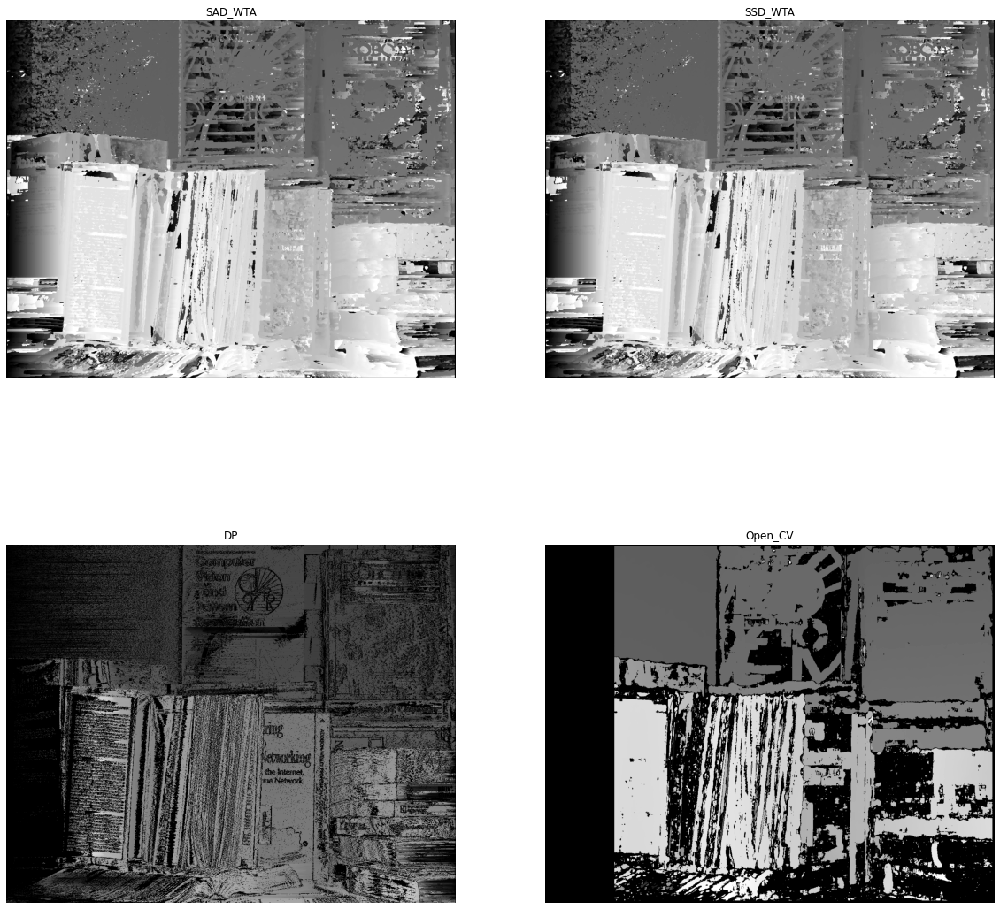

In [ ]:
build_report(data[1])

,algorithms,computation_time,ssim,rmse,psnr
0,SAD_WTA,24.44,0.899566,0.012830,37.835411
1,SSD_WTA,24.15,0.900110,0.012810,37.849325
2,DP,18.52,0.650785,0.021998,33.152334
3,Open_CV,0.289,0.007700,0.307362,10.246992


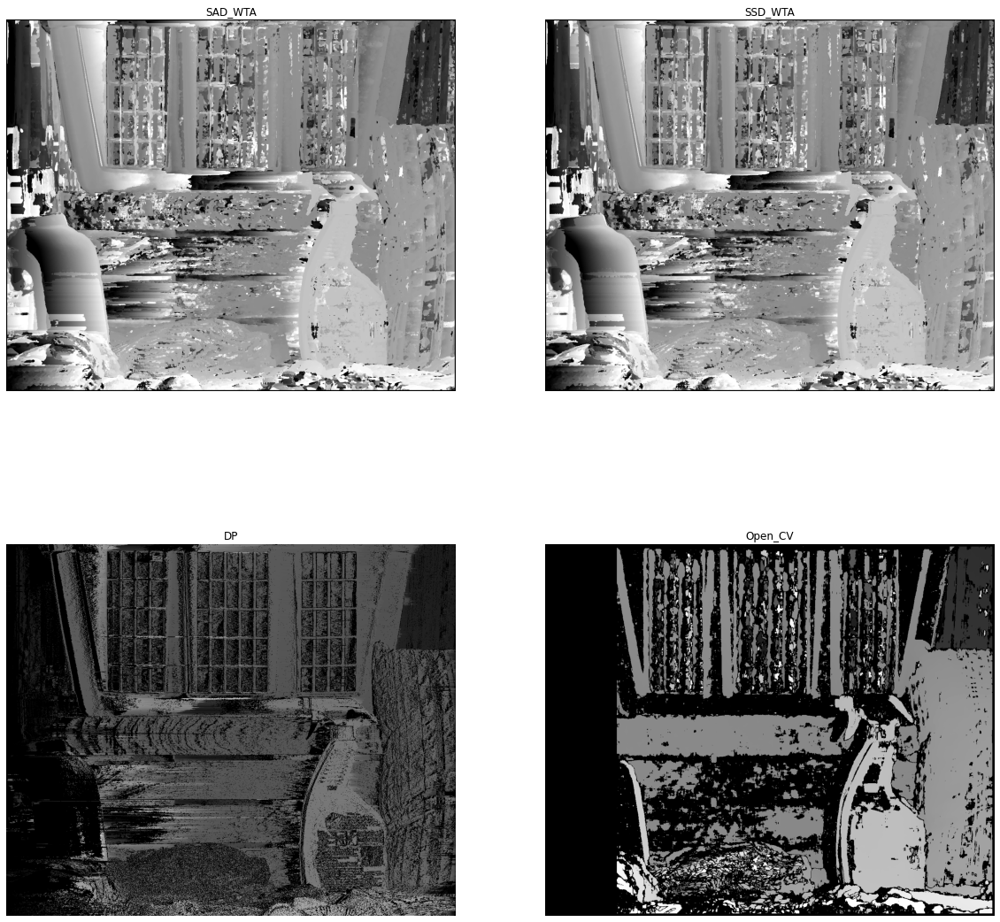

In [ ]:
build_report(data[2])

,algorithms,computation_time,ssim,rmse,psnr
0,SAD_WTA,25.28,0.931370,0.010875,39.271351
1,SSD_WTA,24.96,0.932203,0.010806,39.326862
2,DP,18.25,0.676567,0.021316,33.425772
3,Open_CV,0.317,0.040589,0.423394,7.465110


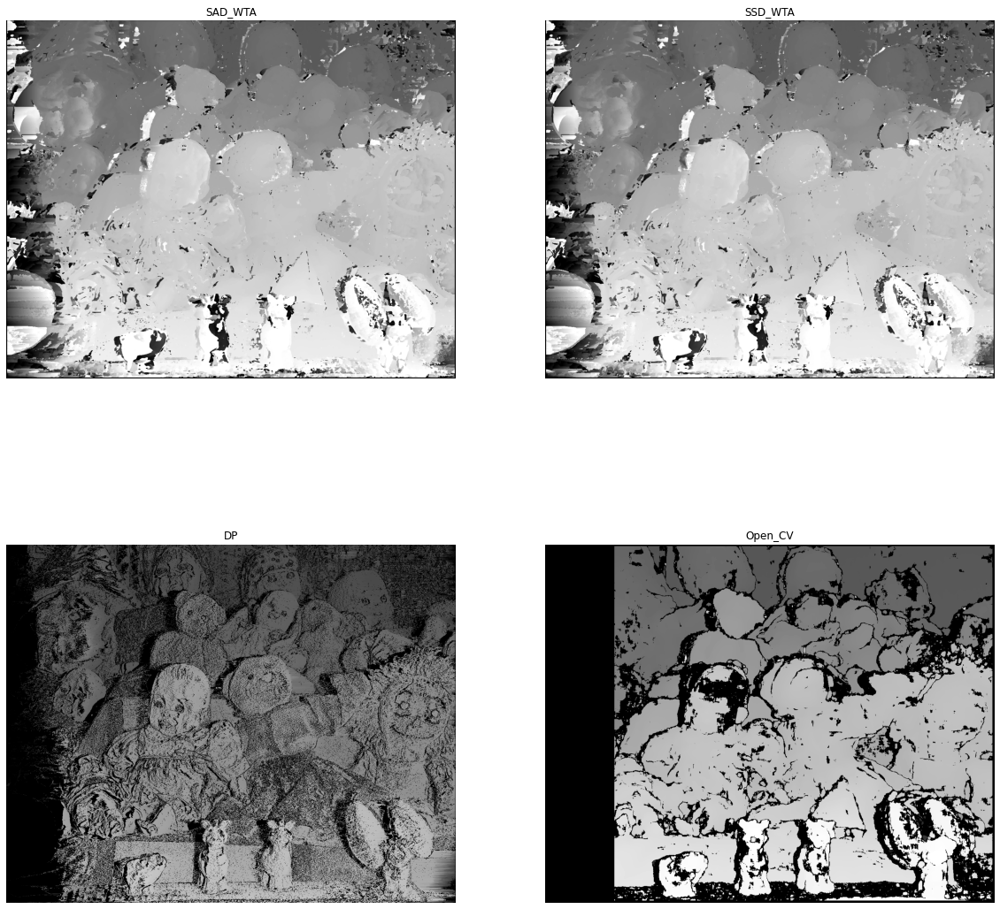

In [ ]:
build_report(data[3])

,algorithms,computation_time,ssim,rmse,psnr
0,SAD_WTA,24.47,0.929560,0.010052,39.955001
1,SSD_WTA,24.12,0.930154,0.010006,39.994356
2,DP,18.07,0.670512,0.020636,33.707671
3,Open_CV,0.302,0.021431,0.370304,8.628836


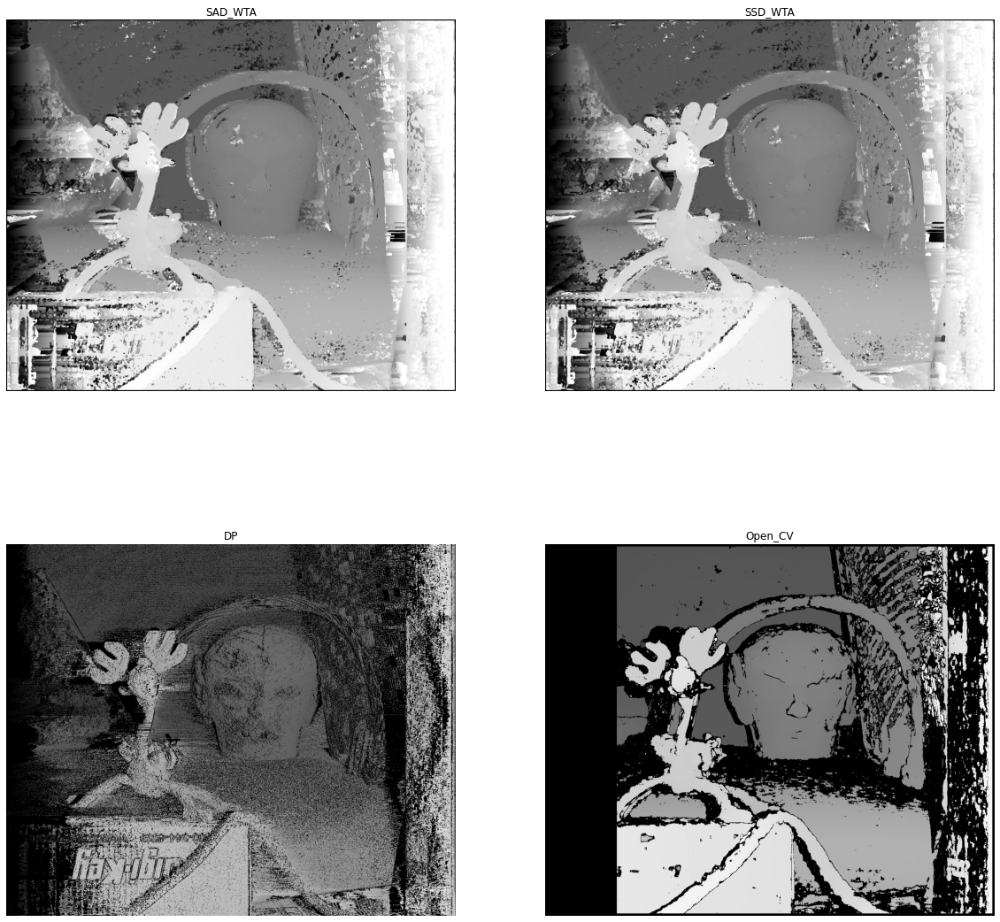

In [ ]:
build_report(data[4])

,algorithms,computation_time,ssim,rmse,psnr
0,SAD_WTA,25.36,0.920961,0.010672,39.435392
1,SSD_WTA,25.05,0.921514,0.010589,39.502803
2,DP,44.06,0.660494,0.019714,34.104409
3,Open_CV,0.333,0.033796,0.313861,10.065255


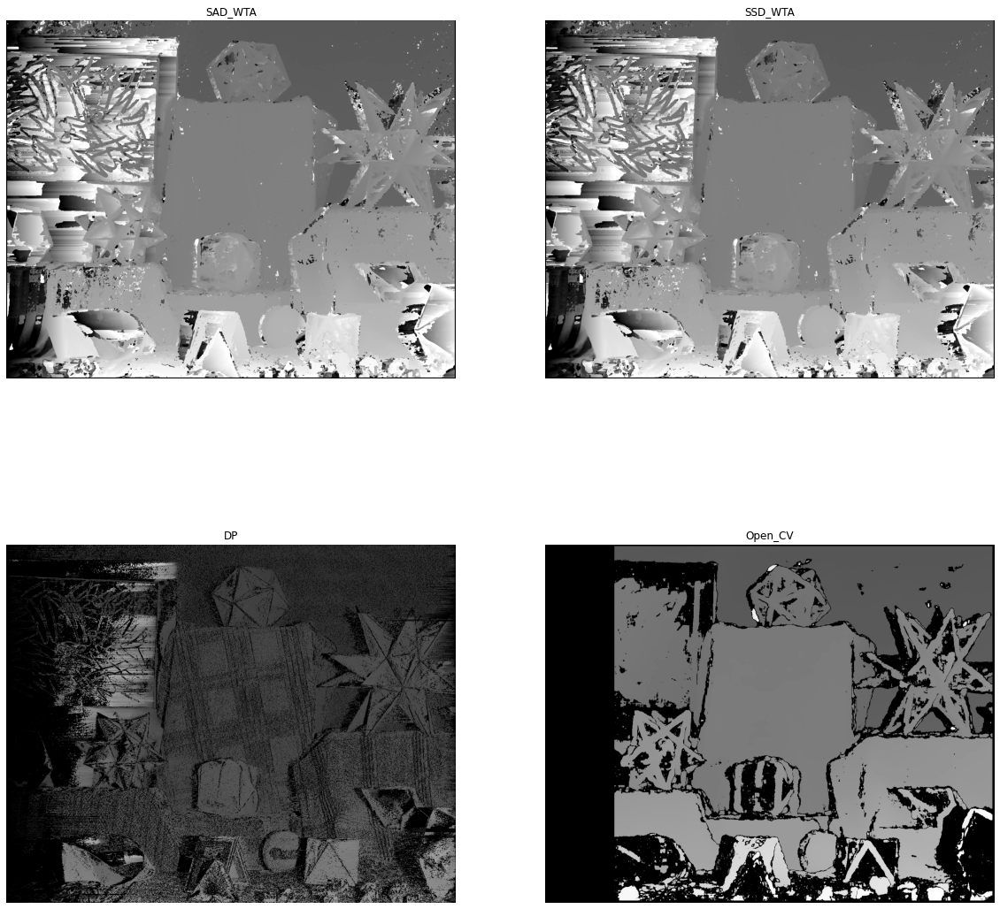

In [ ]:
build_report(data[5])

## 3D Results

In [2]:
files = os.listdir('3D output/')
files

['Art.PNG',
 'Book.PNG',
 'Dolls.PNG',
 'Laundry.PNG',
 'Moebius.PNG',
 'Reindeer.PNG']

In [14]:
def plot_3d_results(results):
    fig = plt.figure(figsize=(20, 20))

    for i, key in enumerate(results):

        fig.add_subplot(3, 3, i+1)
        
        plt.imshow(cv2.imread(f"3D output/{results[i]}"), cmap='gray')
        plt.axis('off')
        plt.title(results[i].split('.')[0])

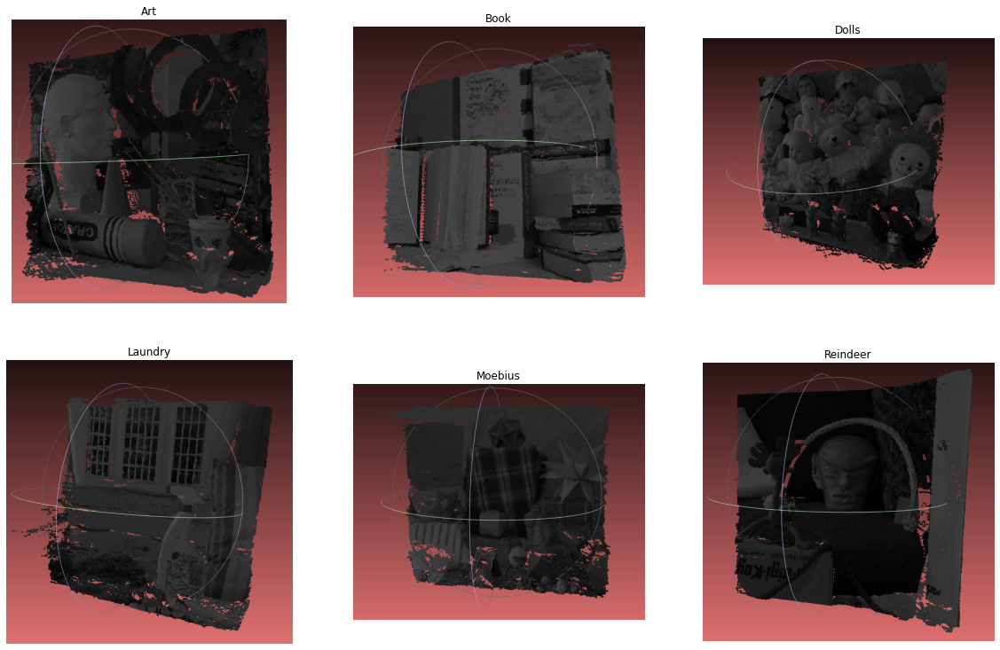

In [15]:
plot_3d_results(files)